In [2]:
# pip install pandas matplotlib seaborn nltk wordcloud scikit-learn plotly datasets flask pickle-mixin

  Installing build dependencies: started
  Installing build dependencies: still running...
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/14.8 MB ? eta -:--:--
   ------- -------------------------------- 2.9/14.8 MB 15.3 MB/s eta 0:00:01
   ------------- -------------------------- 5.0/14.8 MB 12.1 MB/s eta 0:00:01
   --------------------- ------------------ 8.1/14.8 MB 12.9 MB/s eta 0:00:01
   ------------------------------ --------- 11.3/14.8 MB 13.6 MB/s eta 0:00:01
   -------------------------------------- - 14.4/14.8 MB 13.7 MB/s eta 0:00:01
   ---------------------------------------- 14.8/14.8 MB 13.3 MB/s eta 0:00:00
  Created wheel for pickle-mixin: filename=pickle_mixin-1.0.2-py3-none-any.whl 


[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
import sqlite3
import os
import pickle
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
import re
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from collections import Counter
import plotly.express as px
from datasets import load_dataset

In [6]:
nltk.download('stopwords')
nltk.download('punkt_tab')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\agpot\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\agpot\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [7]:
# Style
style.use('ggplot')
stop_words = set(stopwords.words('english'))

In [8]:
# SQLite database setup
conn = sqlite3.connect("reviews_sentiment.db")
cursor = conn.cursor()

In [9]:
# Create table
cursor.execute("""
CREATE TABLE IF NOT EXISTS reviews (
    id INTEGER PRIMARY KEY AUTOINCREMENT,
    review_text TEXT,
    sentiment TEXT
)
""")
conn.commit()

In [10]:
# Load IMDb dataset from Hugging Face
dataset = load_dataset("imdb")
data = pd.DataFrame(dataset['train'])  # Load the training split
data.columns = ['review_text', 'sentiment']

In [11]:
# Convert sentiment to 'positive' and 'negative'
data['sentiment'] = data['sentiment'].replace({1: 'positive', 0: 'negative'})

In [12]:
# Insert data into SQLite
for index, row in data.iterrows():
    cursor.execute("""
    INSERT INTO reviews (review_text, sentiment)
    VALUES (?, ?)""",
    (row['review_text'], row['sentiment']))
conn.commit()

In [13]:
# Verify data
cursor.execute("SELECT COUNT(*) FROM reviews")
print(f"Total records in the database: {cursor.fetchone()[0]}")

# Load data back into DataFrame
df = pd.read_sql_query("SELECT * FROM reviews", conn)

Total records in the database: 50000


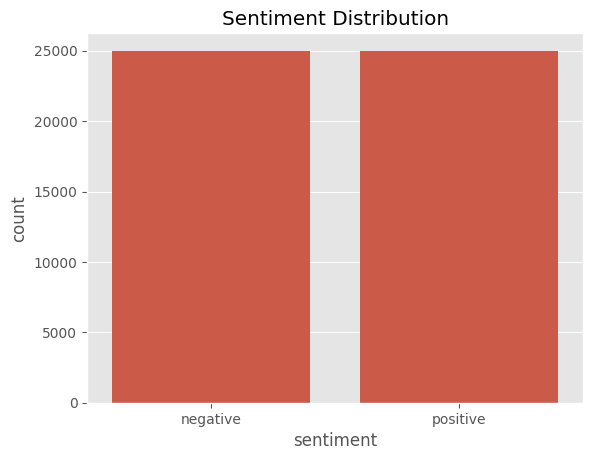

In [14]:
# Data visualization
sns.countplot(x='sentiment', data=df)
plt.title("Sentiment Distribution")
plt.show()

In [15]:

# Example reviews
for i in range(5):
    print(f"Review {i+1}: {df['review_text'].iloc[i]}")
    print(f"Sentiment: {df['sentiment'].iloc[i]}\n")


Review 1: I rented I AM CURIOUS-YELLOW from my video store because of all the controversy that surrounded it when it was first released in 1967. I also heard that at first it was seized by U.S. customs if it ever tried to enter this country, therefore being a fan of films considered "controversial" I really had to see this for myself.<br /><br />The plot is centered around a young Swedish drama student named Lena who wants to learn everything she can about life. In particular she wants to focus her attentions to making some sort of documentary on what the average Swede thought about certain political issues such as the Vietnam War and race issues in the United States. In between asking politicians and ordinary denizens of Stockholm about their opinions on politics, she has sex with her drama teacher, classmates, and married men.<br /><br />What kills me about I AM CURIOUS-YELLOW is that 40 years ago, this was considered pornographic. Really, the sex and nudity scenes are few and far be

In [16]:
# Add word count feature
def no_of_words(text):
    return len(text.split())

df['word_count'] = df['review_text'].apply(no_of_words)

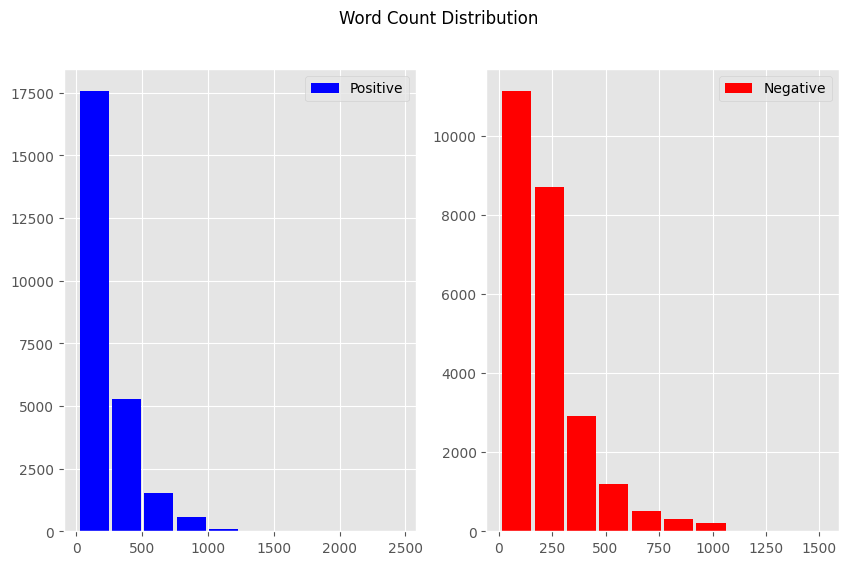

In [17]:
# Word count distribution
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
ax[0].hist(df[df['sentiment'] == 'positive']['word_count'], label='Positive', color='blue', rwidth=0.9)
ax[0].legend(loc='upper right')
ax[1].hist(df[df['sentiment'] == 'negative']['word_count'], label='Negative', color='red', rwidth=0.9)
ax[1].legend(loc='upper right')
fig.suptitle("Word Count Distribution")
plt.show()

In [18]:
# Preprocessing
def data_processing(text):
    text = text.lower()
    text = re.sub('<br />', '', text)
    text = re.sub(r"https\S+|www\S+|http\S+", '', text)
    text = re.sub(r'\@w+|\#', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    text_tokens = word_tokenize(text)
    filtered_text = [w for w in text_tokens if w not in stop_words]
    return " ".join(filtered_text)

df['review_text'] = df['review_text'].apply(data_processing)

In [19]:
# Check for duplicates and drop them
duplicated_count = df.duplicated().sum()
print(f"Number of duplicate entries: {duplicated_count}")
df = df.drop_duplicates('review_text')

# Word cloud for positive and negative reviews
positive_reviews = df[df['sentiment'] == 'positive']
negative_reviews = df[df['sentiment'] == 'negative']

Number of duplicate entries: 0


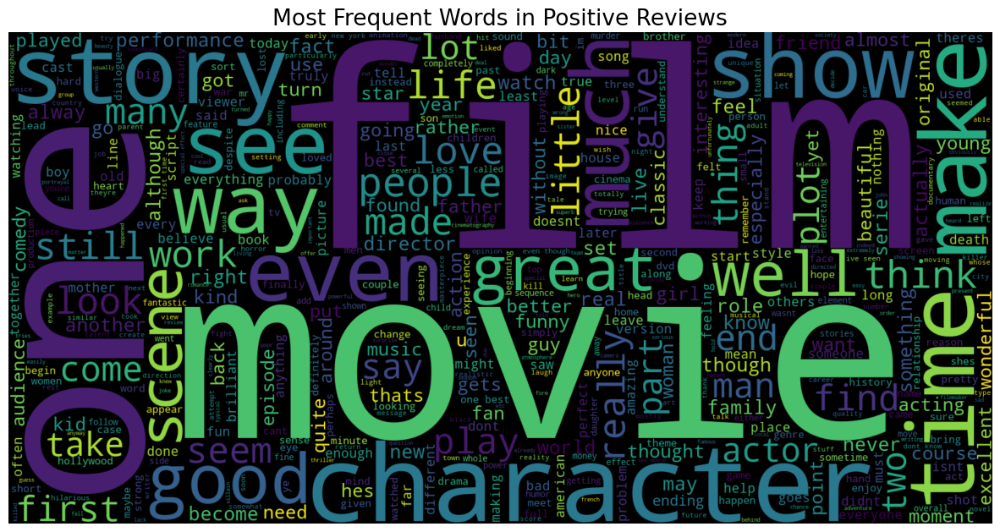

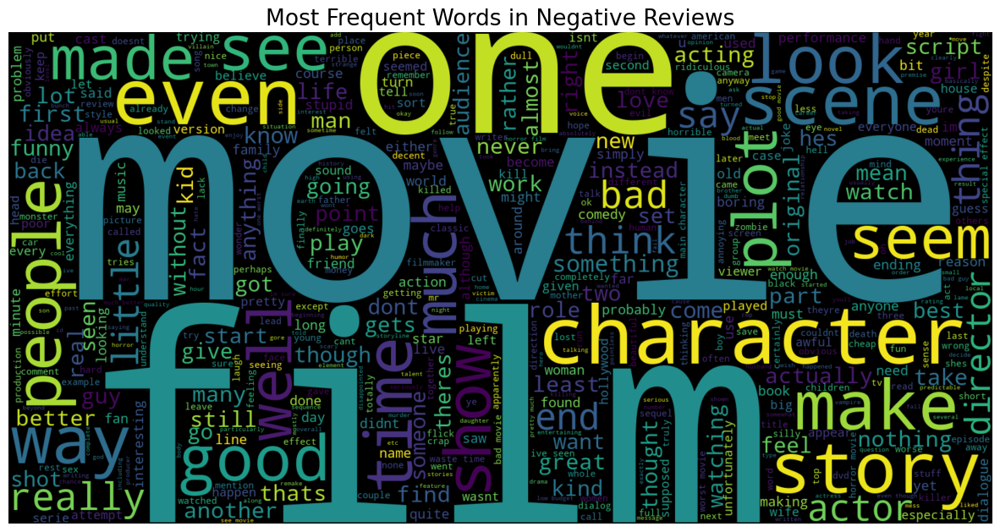

In [20]:
def plot_wordcloud(reviews, title):
    text = ' '.join(reviews)
    wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
    plt.figure(figsize=(15, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=19)
    plt.show()

plot_wordcloud(positive_reviews['review_text'], "Most Frequent Words in Positive Reviews")
plot_wordcloud(negative_reviews['review_text'], "Most Frequent Words in Negative Reviews")


In [21]:
# Common words in reviews
def common_words(reviews, title):
    count = Counter()
    for text in reviews:
        for word in text.split():
            count[word] += 1
    common_df = pd.DataFrame(count.most_common(15), columns=['word', 'count'])
    px.bar(common_df, x='count', y='word', title=title, color='word').show()

common_words(positive_reviews['review_text'], "Common Words in Positive Reviews")
common_words(negative_reviews['review_text'], "Common Words in Negative Reviews")


In [22]:
# Sentiment encoding
df['sentiment'] = df['sentiment'].replace({"positive": 1, "negative": 0})

C:\Users\agpot\AppData\Local\Temp\ipykernel_2052\392008112.py:2: FutureWarning:

Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`



In [23]:
# Ensure the "Model2" directory exists
os.makedirs("Models", exist_ok=True)

In [24]:
# Train-test split
X = df['review_text']
y = df['sentiment']
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(X)
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)


In [26]:
# Save the vectorizer
with open("Models/tfidf_vectorizer.pkl", "wb") as f:
    pickle.dump(vectorizer, f)

In [27]:
# Models and evaluation
def train_and_evaluate_model(model, model_name):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"{model_name} Accuracy: {acc * 100:.2f}%")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    # Save the trained model
    model_path = f"Model2/{model_name.replace(' ', '_').lower()}.pkl"
    with open(model_path, "wb") as f:
        pickle.dump(model, f)
    print(f"{model_name} saved to {model_path}")

models = [
    (LogisticRegression(), "Logistic Regression"),
    (MultinomialNB(), "Multinomial Naive Bayes"),
    (LinearSVC(), "Linear SVM")
]

for model, name in models:
    train_and_evaluate_model(model, name)

print("All models and the vectorizer have been saved in the 'Models' folder.")

# Close SQLite connection
conn.close()

Logistic Regression Accuracy: 88.98%
[[3285  463]
 [ 360 3363]]
              precision    recall  f1-score   support

           0       0.90      0.88      0.89      3748
           1       0.88      0.90      0.89      3723

    accuracy                           0.89      7471
   macro avg       0.89      0.89      0.89      7471
weighted avg       0.89      0.89      0.89      7471

Logistic Regression saved to Model2/logistic_regression.pkl
Multinomial Naive Bayes Accuracy: 86.59%
[[3283  465]
 [ 537 3186]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      3748
           1       0.87      0.86      0.86      3723

    accuracy                           0.87      7471
   macro avg       0.87      0.87      0.87      7471
weighted avg       0.87      0.87      0.87      7471

Multinomial Naive Bayes saved to Model2/multinomial_naive_bayes.pkl
Linear SVM Accuracy: 89.10%
[[3318  430]
 [ 384 3339]]
              precision    reca

Logistic Regression Accuracy: 88.98%
[[3285  463]
 [ 360 3363]]
              precision    recall  f1-score   support

           0       0.90      0.88      0.89      3748
           1       0.88      0.90      0.89      3723

    accuracy                           0.89      7471
   macro avg       0.89      0.89      0.89      7471
weighted avg       0.89      0.89      0.89      7471



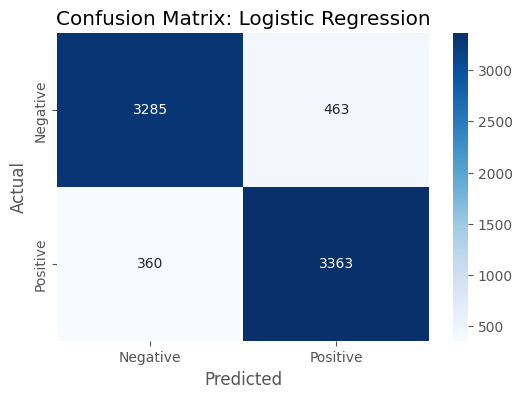

Multinomial Naive Bayes Accuracy: 86.59%
[[3283  465]
 [ 537 3186]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87      3748
           1       0.87      0.86      0.86      3723

    accuracy                           0.87      7471
   macro avg       0.87      0.87      0.87      7471
weighted avg       0.87      0.87      0.87      7471



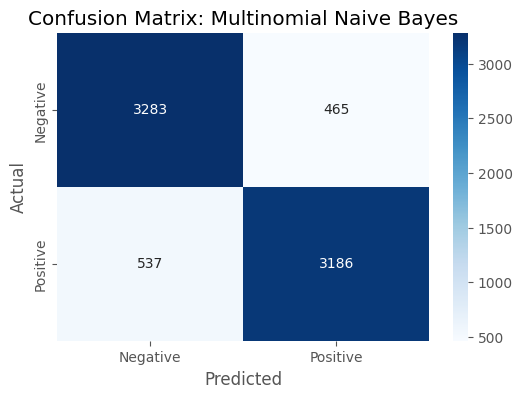

Linear SVM Accuracy: 89.10%
[[3318  430]
 [ 384 3339]]
              precision    recall  f1-score   support

           0       0.90      0.89      0.89      3748
           1       0.89      0.90      0.89      3723

    accuracy                           0.89      7471
   macro avg       0.89      0.89      0.89      7471
weighted avg       0.89      0.89      0.89      7471



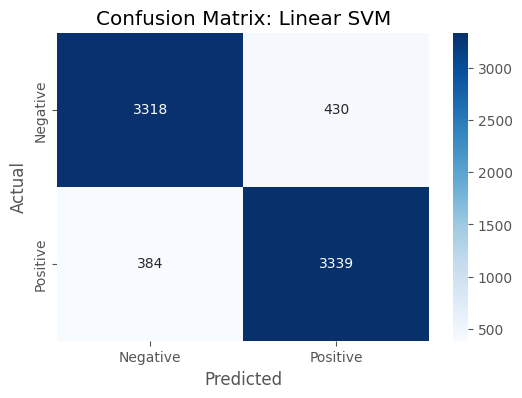

C:\Users\agpot\AppData\Local\Temp\ipykernel_2052\1388325348.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




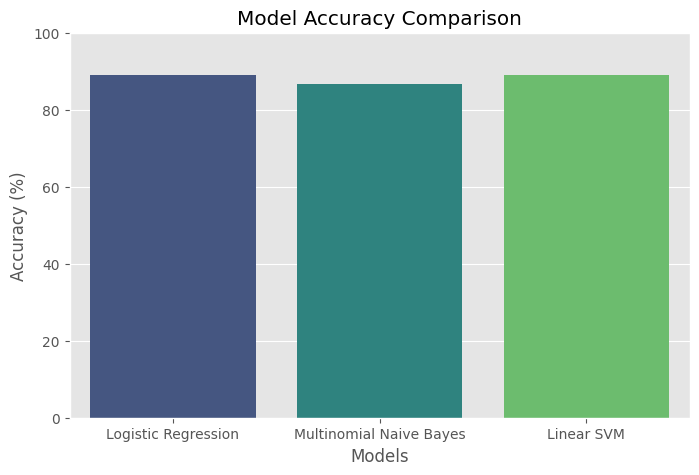

In [28]:
# Collect results
results = []

for model, name in models:
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    acc = accuracy_score(y_test, y_pred)
    results.append((name, acc * 100))
    print(f"{name} Accuracy: {acc * 100:.2f}%")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    # Plot confusion matrix as heatmap
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Negative", "Positive"], yticklabels=["Negative", "Positive"])
    plt.title(f"Confusion Matrix: {name}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

# Bar chart for model accuracies
model_names, accuracies = zip(*results)
plt.figure(figsize=(8, 5))
sns.barplot(x=list(model_names), y=list(accuracies), palette="viridis")
plt.title("Model Accuracy Comparison")
plt.xlabel("Models")
plt.ylabel("Accuracy (%)")
plt.ylim(0, 100)
plt.show()
